In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 
import os
import scipy 
import warnings
import kshape
from statsmodels.tsa.seasonal import STL
import statsmodels.api as sm
import scaleogram as scg 
from statsmodels.tsa.stattools import adfuller
warnings.filterwarnings('ignore')

In [17]:
def changepoint_detection(ts,percent=0.05,plot=True,num_c=4):
    import ruptures as rpt
    from pyinform.blockentropy import block_entropy
    dic = {}
    length = len(ts)
    bar = int(percent*length)
    ts = np.array(ts) [bar:-bar]
    min_val = length
    model = "l1" 
    algo = rpt.Dynp(model="normal").fit(np.array(ts))
    dic = {"best":[0,length]}
    try :
        for i in range(num_c) :
            my_bkps = algo.predict(n_bkps=i)
            if plot :
                rpt.show.display(np.array(ts), my_bkps, figsize=(10, 6))
                plt.show()
            start_borne = 0
            full_entro = 0
            for borne in my_bkps :
                val = block_entropy(ts[start_borne:borne], k=1)   
                full_entro = val + full_entro
                start_borne = borne
            if full_entro == 0 :
                break
            elif full_entro < min_val :
                #print(min_val)
                #print(i,full_entro)
                min_val = full_entro
                #print(my_bkps)
                dic["best"] = [0]+my_bkps
            else :
                pass 
    except Exception as e :
        print(e)
        print("Not enough point")
        return {"best":[0,length]}
    return dic

In [18]:
elements = os.listdir("../classes")
Mat = {}
for element in elements :
    if element[0] != "m" :
        new_mat = []
        dirs = os.listdir("../classes/"+element)
        for dir in dirs:
            if dir[-3 :] == "png" and dir[0]!="m":
                ts = pd.read_csv("{}.csv".format(int(dir.replace(".png",""))))["x"]
                new_mat.append(ts)
        Mat[int(element.replace("class_",""))] = new_mat

In [21]:
j=0
max_length = 0
SIG = [None]*18
class_card = [None]*18
MEAN = [None]*18
STD = [None]*18
EN = [None]*18
AMP = [None]*18
for key,signal in Mat.items(): 
    class_len = []
    class_var = []
    class_mean = []
    class_mean_en = []
    amp = []
    for sig in signal :
        class_len.append(len(sig))
        class_var.append(np.std(np.array(sig)))
        class_mean.append(np.mean(np.array(sig)))
        class_mean_en.append(np.sum(np.square(np.array(sig)))/len(sig))
        amp.append(np.max(sig)-np.min(sig))
    SIG[key-1]=class_len
    STD[key-1]=class_var
    MEAN[key-1]=class_mean
    EN[key-1] = class_mean_en
    AMP[key-1] = amp
    class_card[key-1]=len(class_len)




       

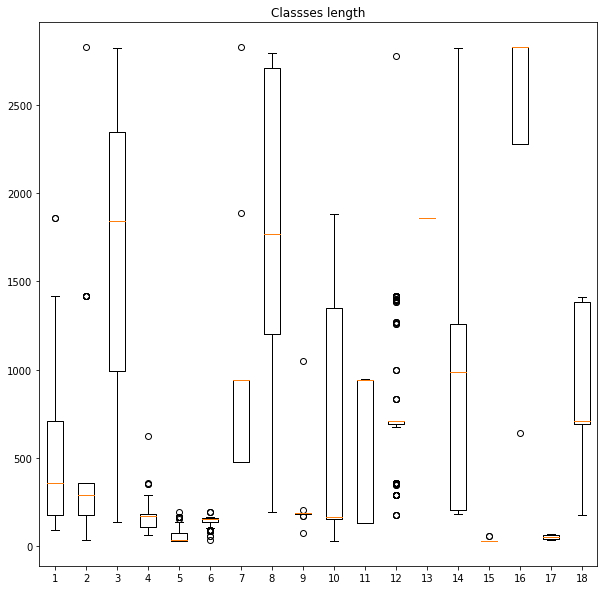

In [22]:
plt.figure(figsize=(10,10))
plt.boxplot(SIG)
plt.title("Classses length")
plt.savefig("class_len.png")
plt.show()

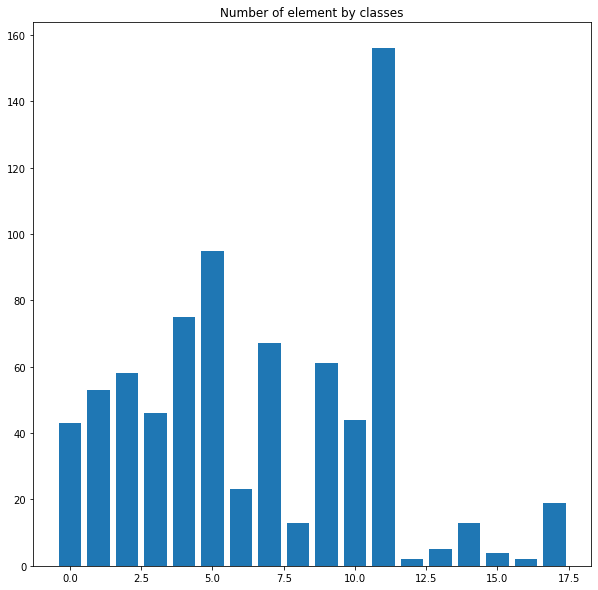

In [6]:
plt.figure(figsize=(10,10))
plt.bar(x =np.arange(18),height=class_card)
plt.title("Number of element by classes")
plt.show()

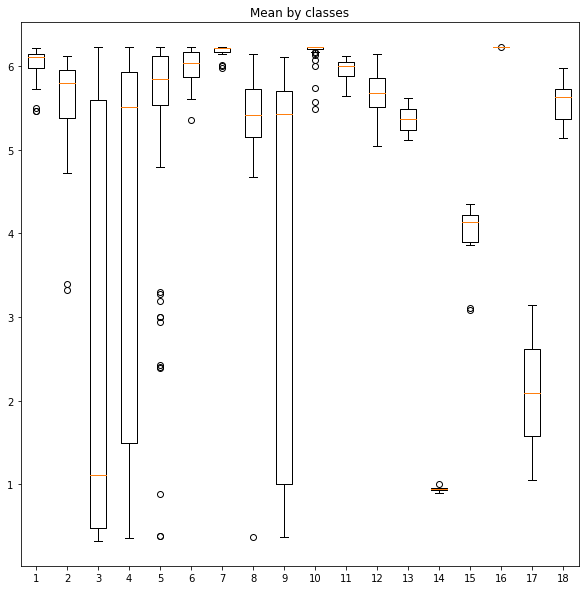

In [23]:
plt.figure(figsize=(10,10))
plt.boxplot(MEAN)
plt.title("Mean by classes")
plt.savefig("mean.png")
plt.show()

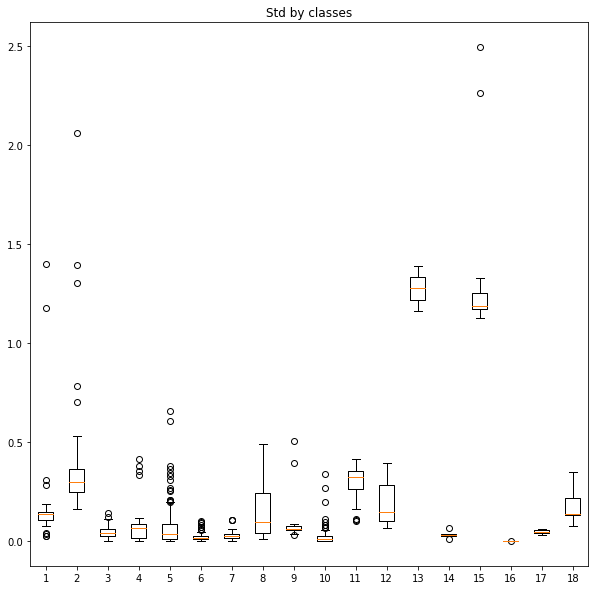

In [24]:
plt.figure(figsize=(10,10))
plt.boxplot(STD)
plt.title("Std by classes")
plt.savefig("std.png")
plt.show()

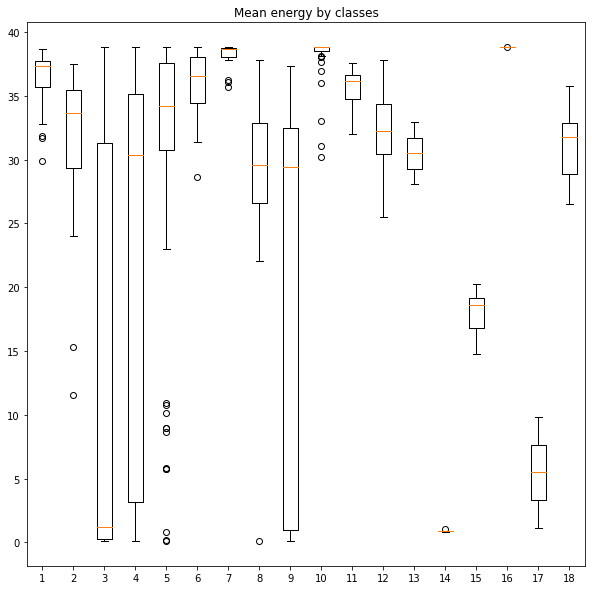

In [25]:

plt.figure(figsize=(10,10))
plt.boxplot(EN)
plt.title("Mean energy by classes")
plt.savefig("mean_energy.png")
plt.show()

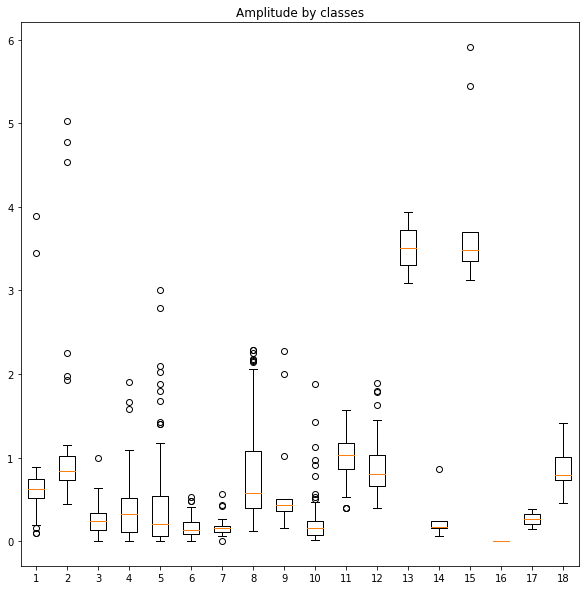

In [26]:
plt.figure(figsize=(10,10))
plt.boxplot(AMP)
plt.title("Amplitude by classes")
plt.savefig("ampl.png")
plt.show()

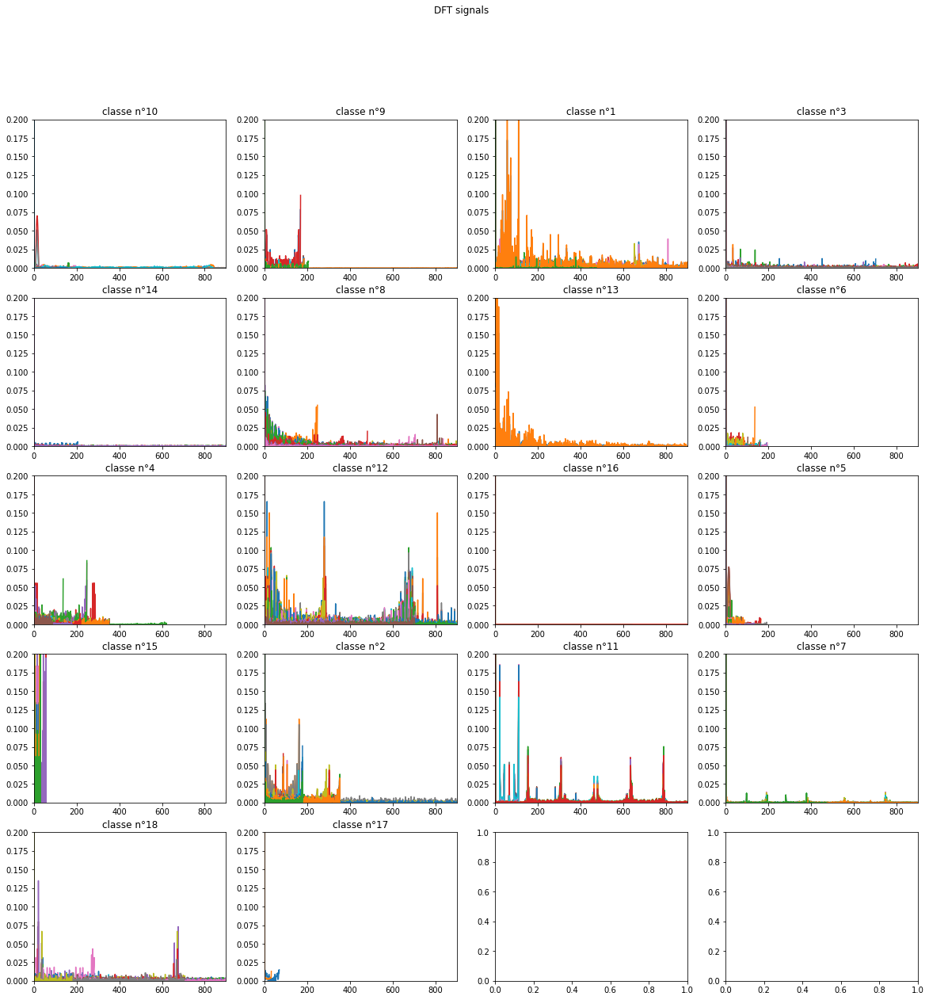

In [11]:
fig , axs = plt.subplots(5,4,figsize=(20,20))
j=0
for key,signal in Mat.items(): 
    for sig in signal :
        axs[j//4,j%4].plot(np.fft.fft(sig)/len(sig))
    axs[j//4,j%4].title.set_text("classe n°"+str(key))
    axs[j//4,j%4].axis(xmin=0,xmax=900)
    axs[j//4,j%4].set_ylim(0,0.2)
    j+=1
fig.suptitle("DFT signals")
plt.show()

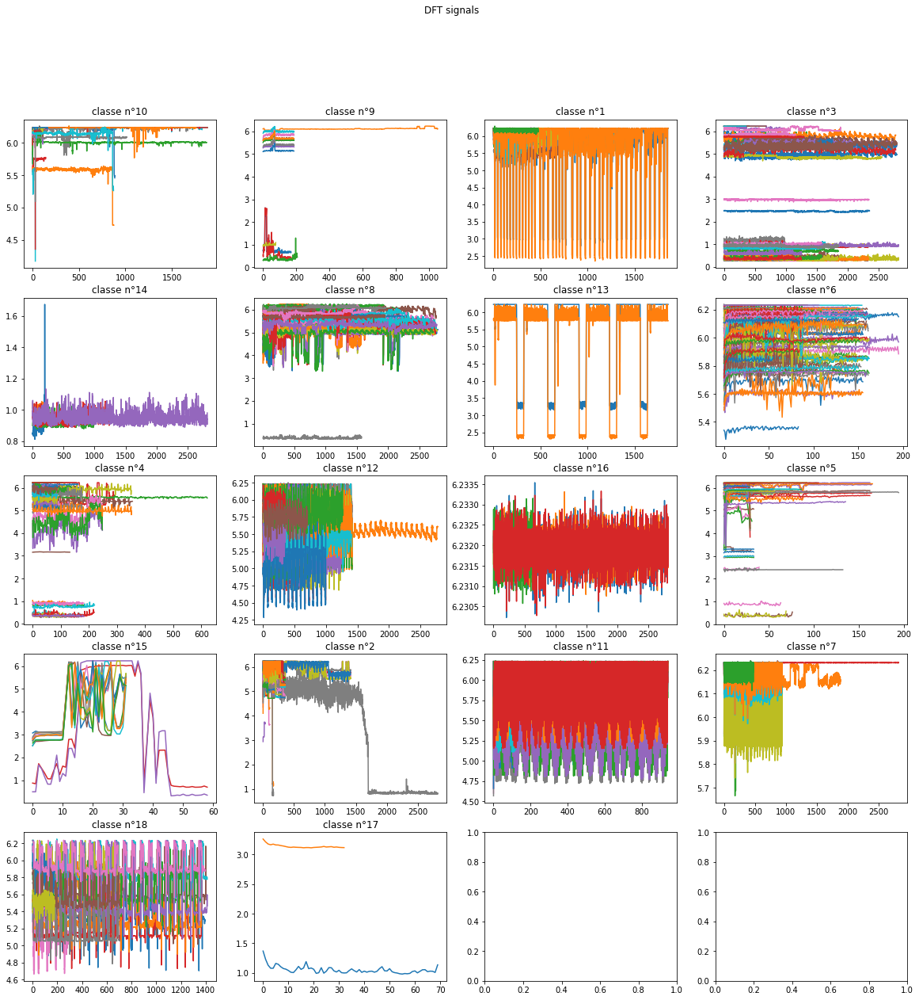

In [12]:
fig , axs = plt.subplots(5,4,figsize=(20,20))
j=0
for key,signal in Mat.items(): 
    for sig in signal :
        axs[j//4,j%4].plot(sig)
    axs[j//4,j%4].title.set_text("classe n°"+str(key))
    j+=1
fig.suptitle("DFT signals")
plt.show()

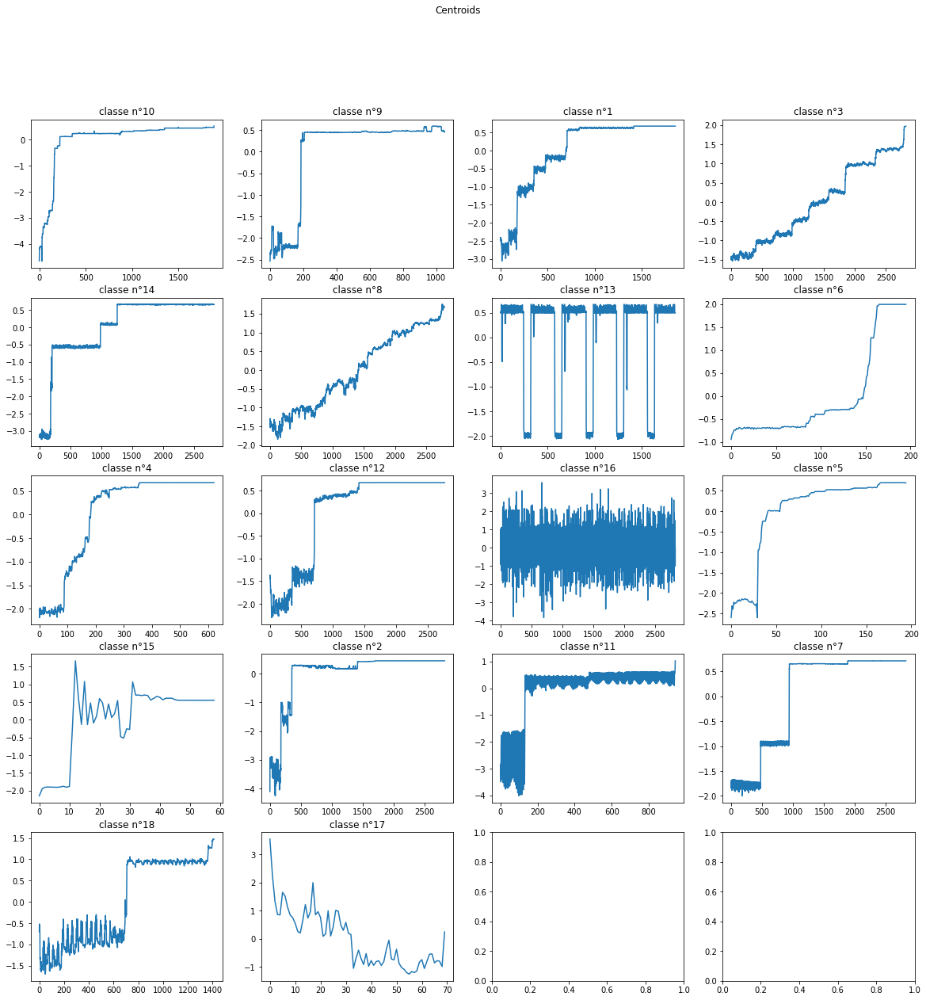

In [20]:
from kshape.core import kshape, zscore

fig , axs = plt.subplots(5,4,figsize=(20,20))
j=0
for key,signal in Mat.items(): 
    time_series = []
    length_max = 0
    for sig in signal :
        if length_max < sig.size :
            length_max = sig.size
        arr = np.ones((2897))+np.mean(np.array(sig)) 
        arr[: len(sig)]=np.array(sig)
        time_series.append((arr-np.mean(arr))/np.std(arr))
    time_series = [np.array(ele)[: length_max] for ele in time_series ]
    cluster_num = 1
    clusters = kshape(zscore(time_series, axis=1), cluster_num)
    ts = clusters[0][0]
    axs[j//4,j%4].plot(ts)
    axs[j//4,j%4].title.set_text("classe n°"+str(key))
    j+=1
fig.suptitle("Centroids")
plt.show()


In [5]:
def plotseasonal(res, axes ):
    res.observed.plot(ax=axes[0], legend=False)
    axes[0].set_ylabel('Observed')
    res.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    res.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    res.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residual')

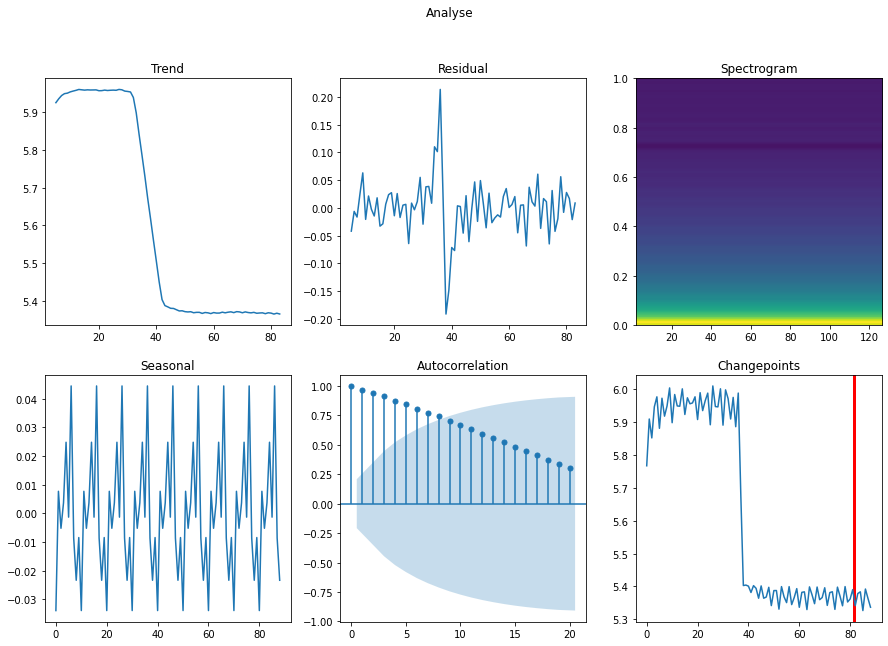

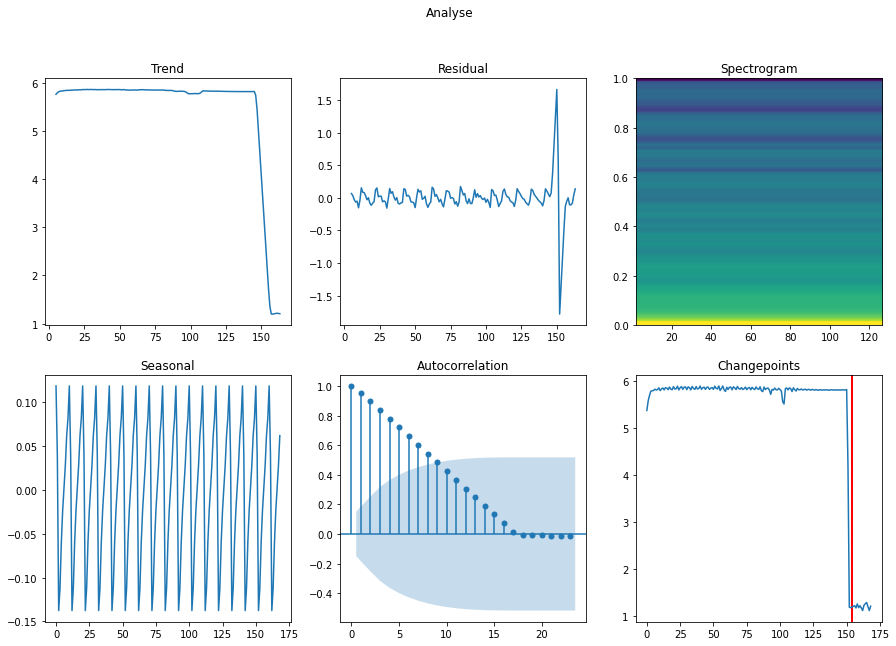

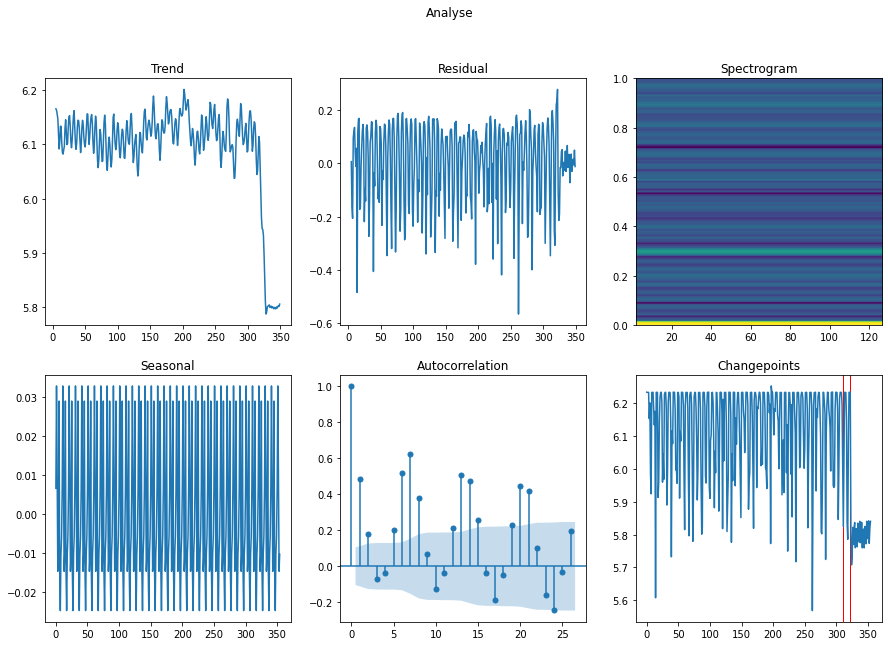

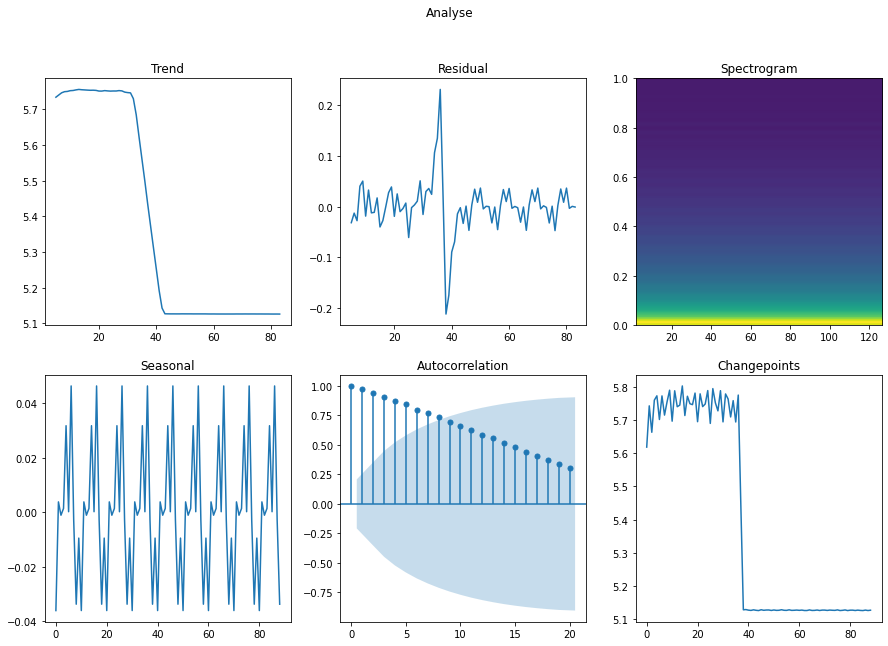

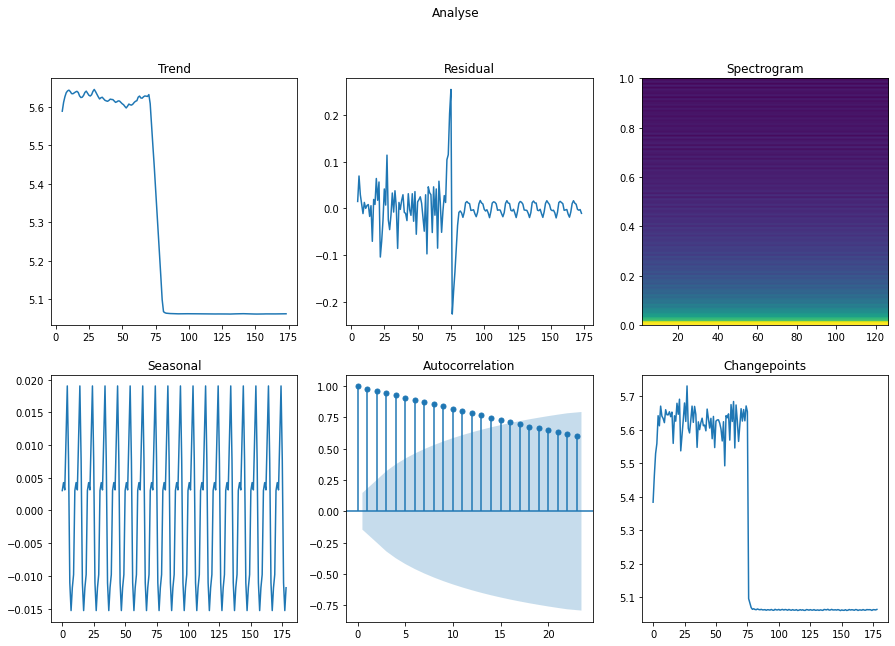

...

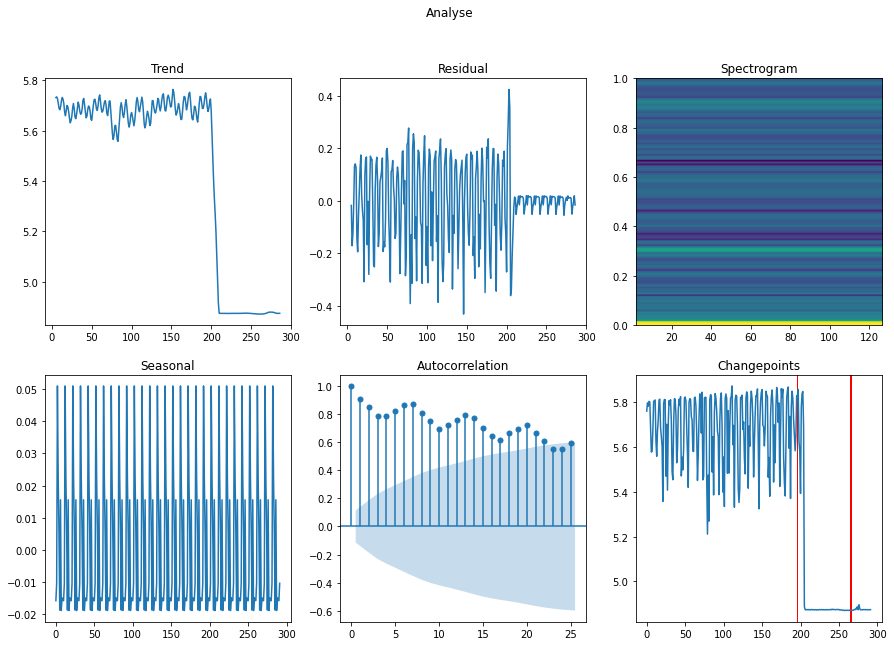

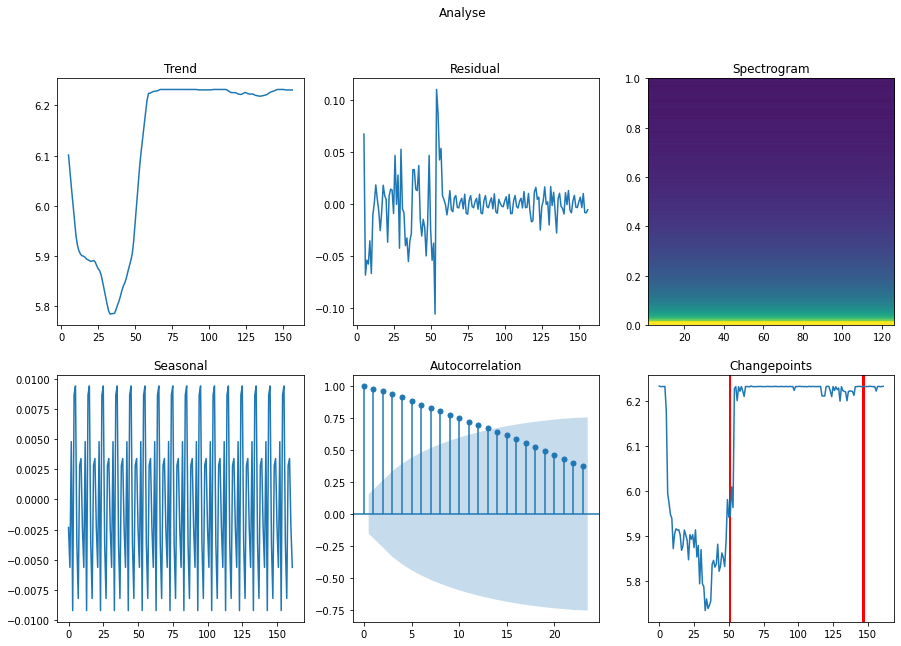

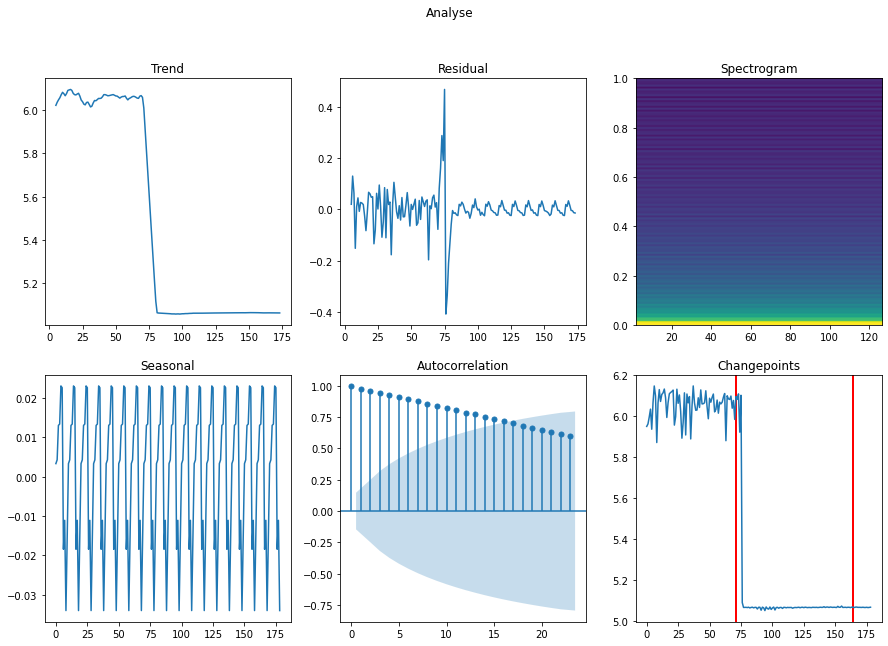

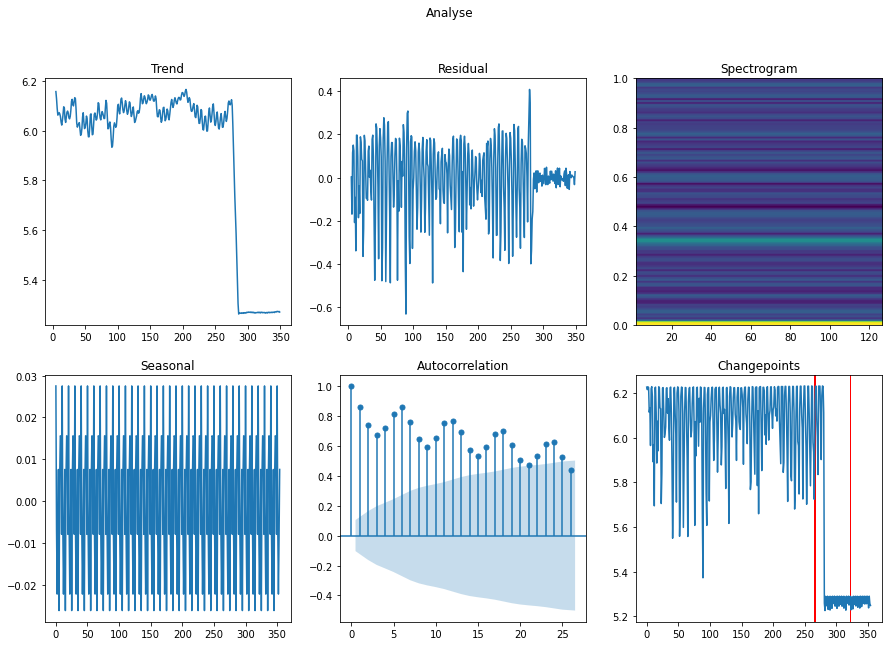

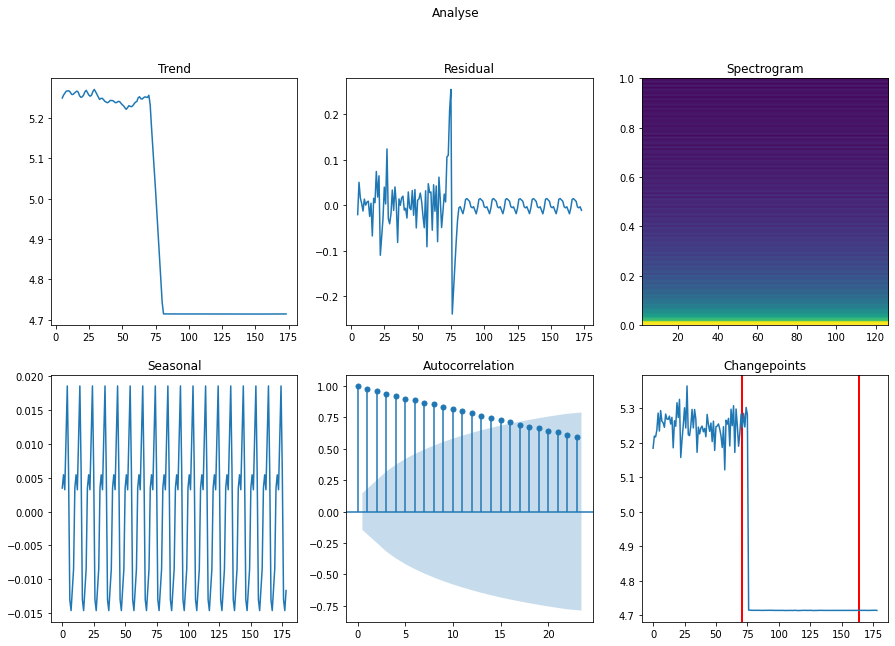

In [28]:
for element in Mat[2]:
    fig,axs = plt.subplots(2,3,figsize=(15,10))
    decomp = sm.tsa.seasonal_decompose(np.array(element),period=10)
    dic = changepoint_detection(np.array(element),plot=False)            
    axs[0,0].plot(decomp.trend)
    axs[0,0].title.set_text("Trend")
    axs[0,1].plot(decomp.resid)
    axs[0,1].title.set_text("Residual")
    axs[0,2].specgram(element, noverlap=len(ts)/10)
    axs[0,2].title.set_text("Spectrogram")
    axs[1,0].plot(decomp.seasonal)
    axs[1,0].title.set_text("Seasonal")
    axs[1,2].plot(np.array(element))
    if len(dic["best"]) > 1 :
        for i in range(1,len(dic["best"])):
            if dic["best"][i]< 0.92*len(element) :
                axs[1,2].axvspan(xmin=dic["best"][i],xmax=dic["best"][i]+1,ymin=0,ymax=np.max(np.array(element)),color="red")
    axs[1,2].title.set_text("Changepoints")
    sm.graphics.tsa.plot_acf(np.array(element),ax=axs[1,1])
    fig.suptitle("Analyse")
    plt.savefig("class_2.png")
    plt.show()

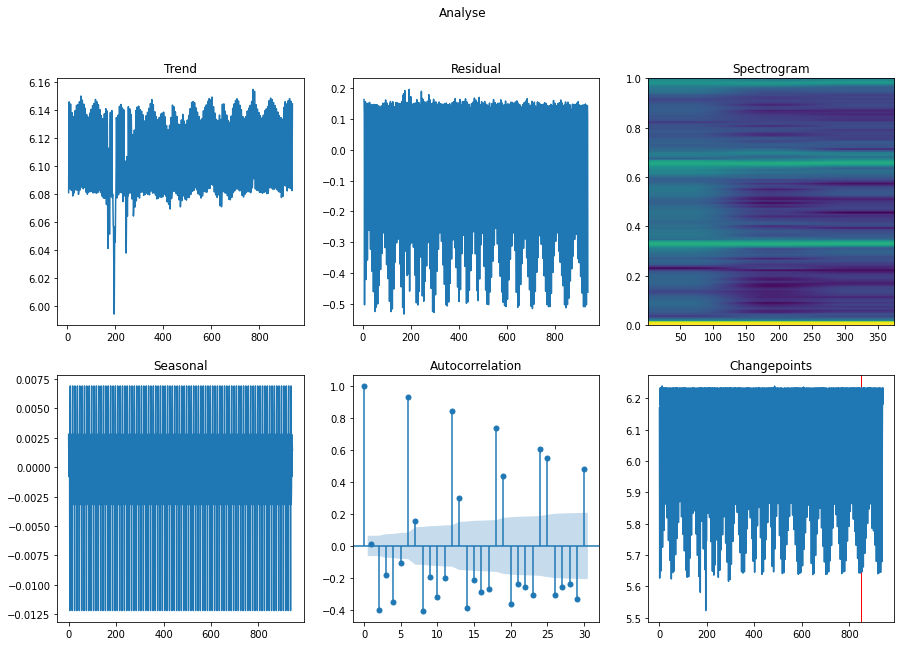

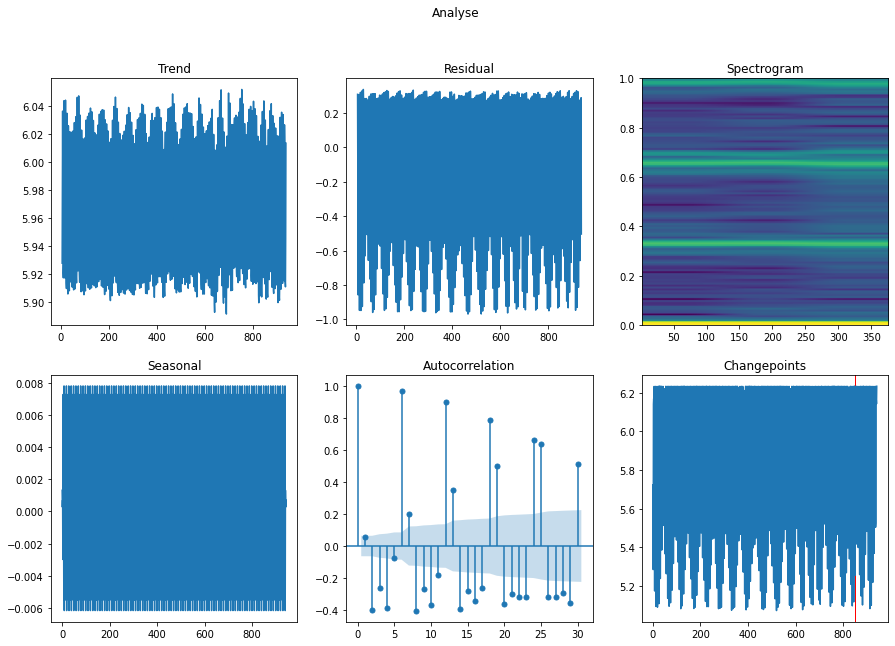

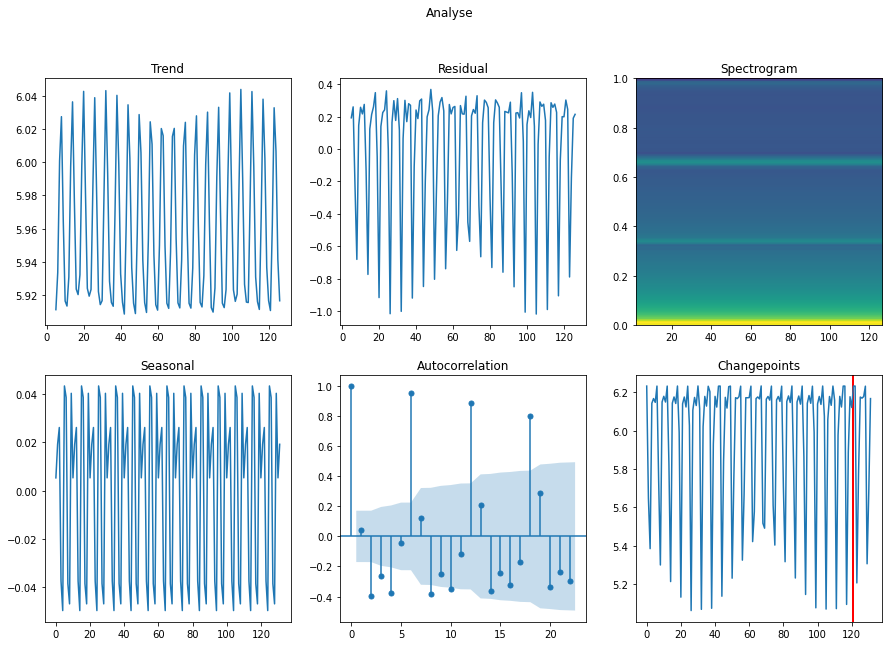

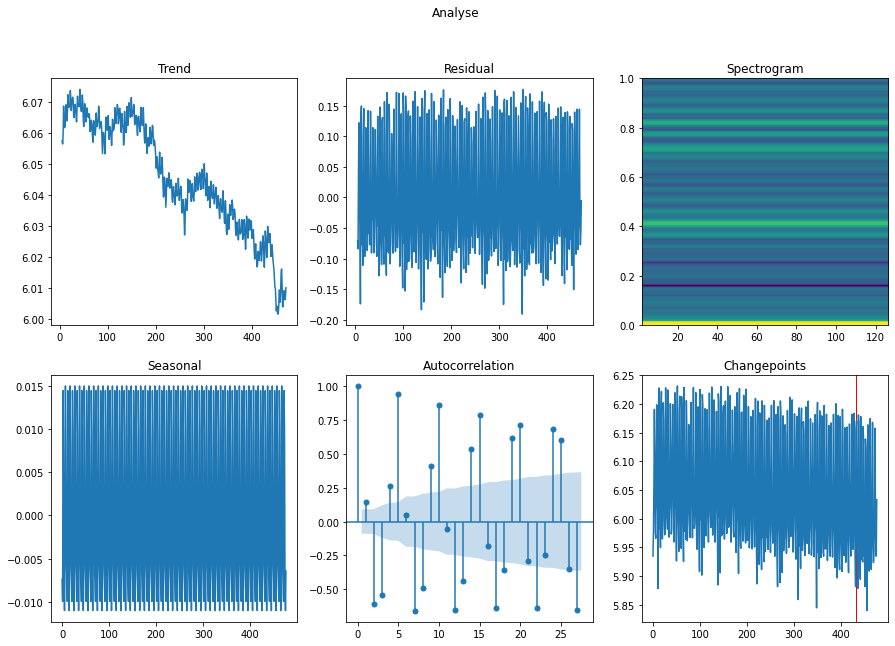

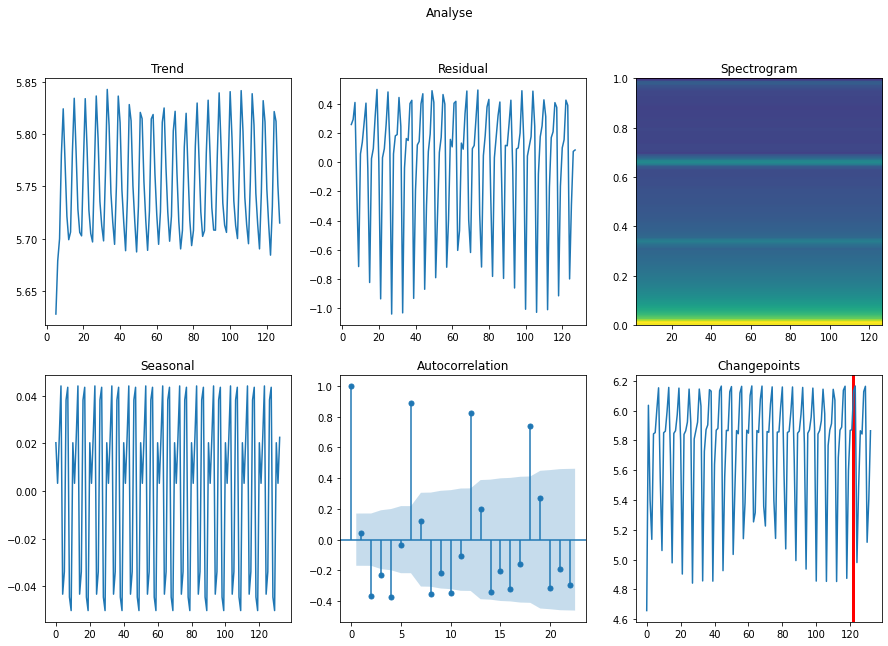

...

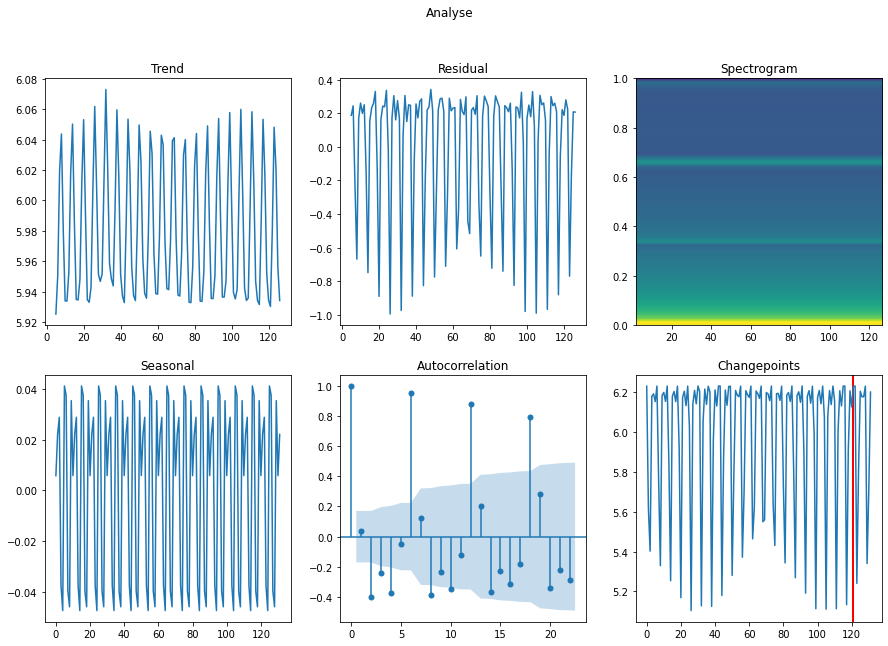

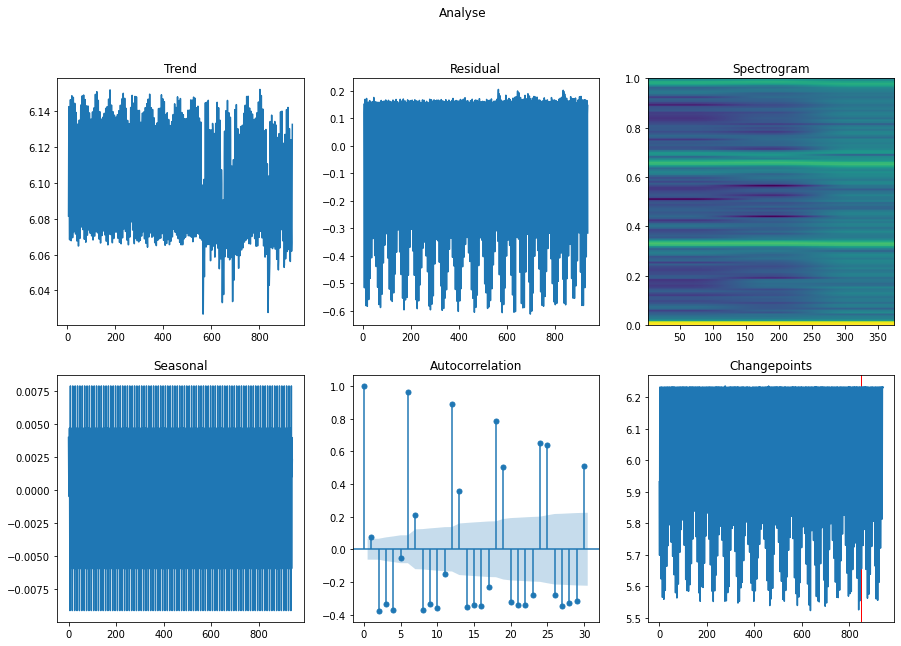

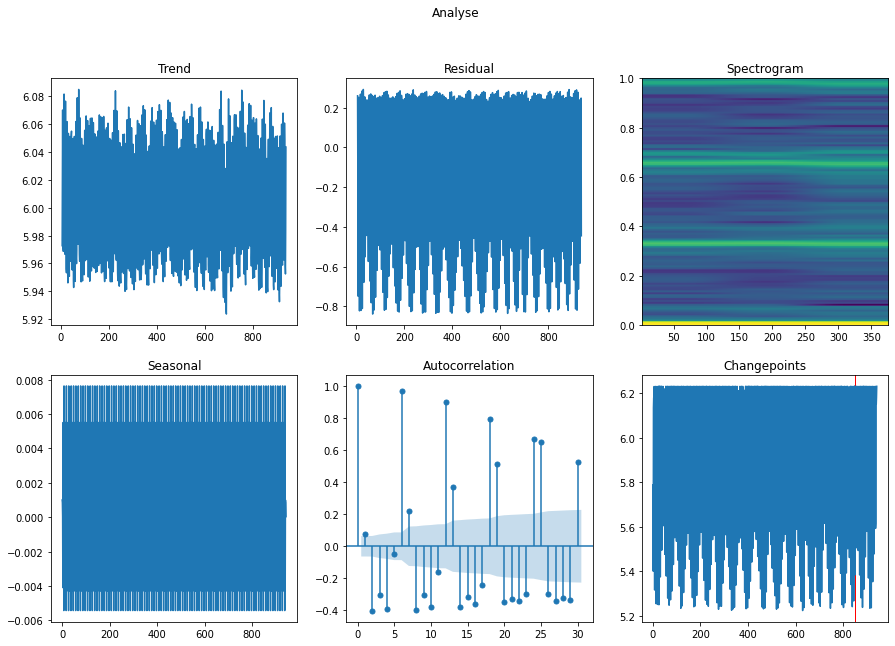

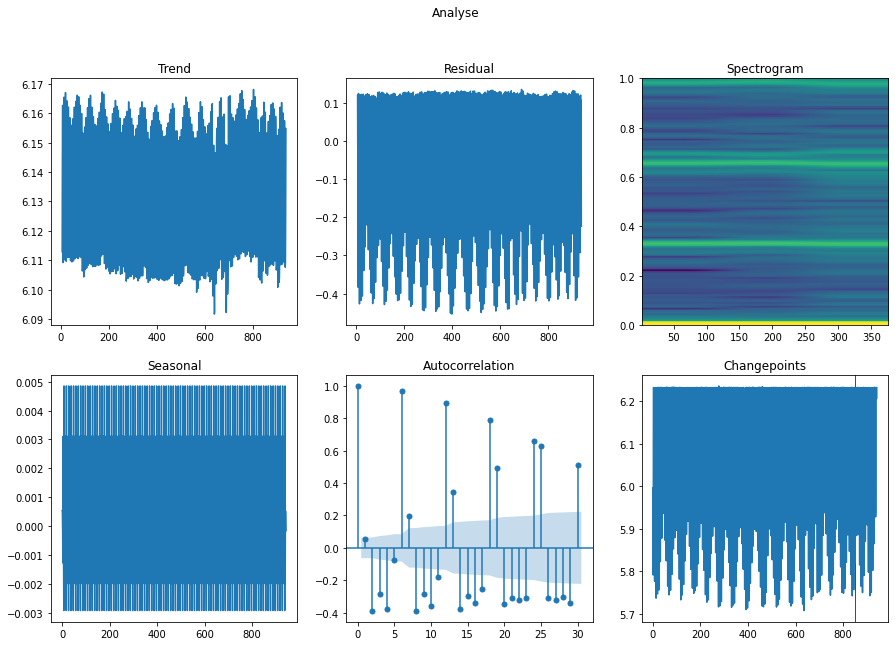

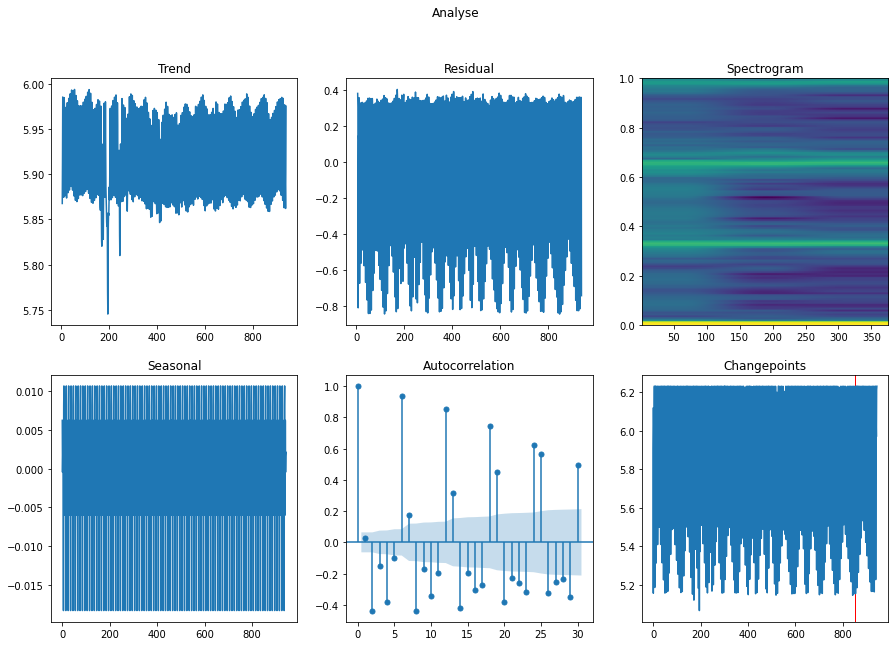

In [16]:
for element in Mat[11]:
    fig,axs = plt.subplots(2,3,figsize=(15,10))
    decomp = sm.tsa.seasonal_decompose(np.array(element),period=10)
    dic = changepoint_detection(np.array(element),plot=False)            
    axs[0,0].plot(decomp.trend)
    axs[0,0].title.set_text("Trend")
    axs[0,1].plot(decomp.resid)
    axs[0,1].title.set_text("Residual")
    axs[0,2].specgram(element, noverlap=len(ts)/10)
    axs[0,2].title.set_text("Spectrogram")
    axs[1,0].plot(decomp.seasonal)
    axs[1,0].title.set_text("Seasonal")
    axs[1,2].plot(np.array(element))
    if len(dic["best"]) > 1 :
        for i in range(1,len(dic["best"])):
            if dic["best"][i]< 0.92*len(element) :
                axs[1,2].axvspan(xmin=dic["best"][i],xmax=dic["best"][i]+1,ymin=0,ymax=np.max(np.array(element)),color="red")
    axs[1,2].title.set_text("Changepoints")
    sm.graphics.tsa.plot_acf(np.array(element),ax=axs[1,1])
    fig.suptitle("Analyse")
    plt.show()

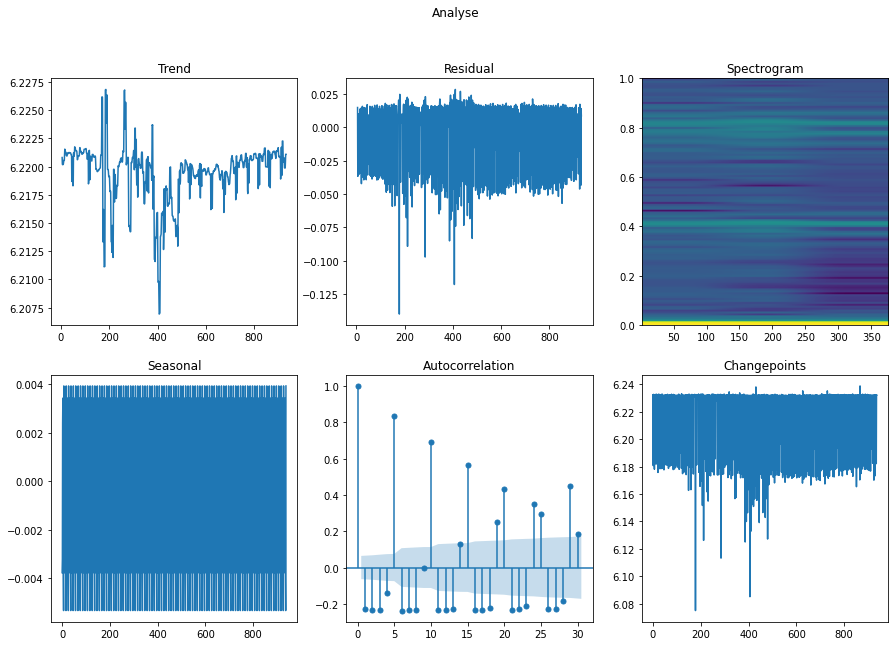

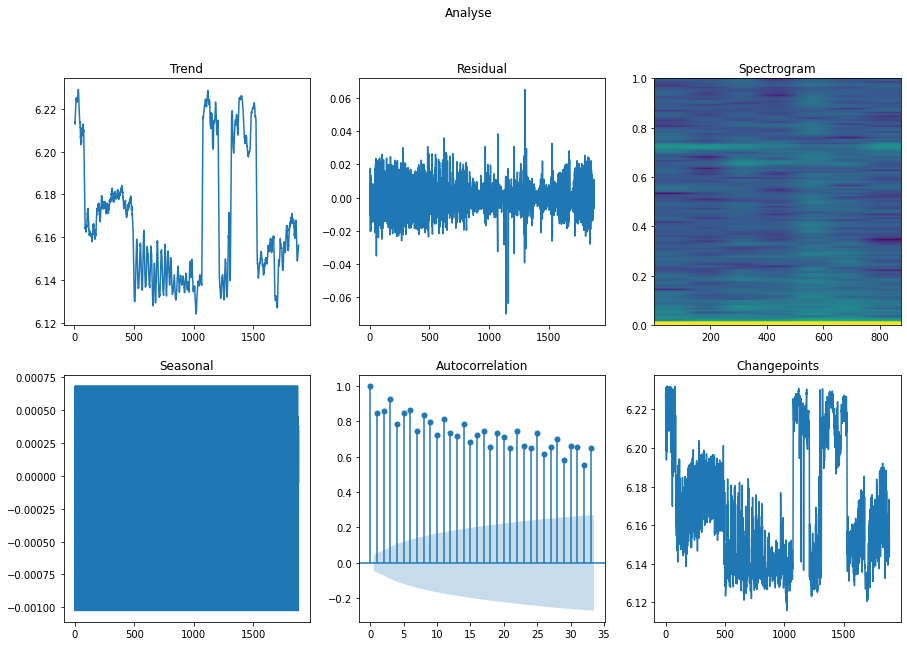

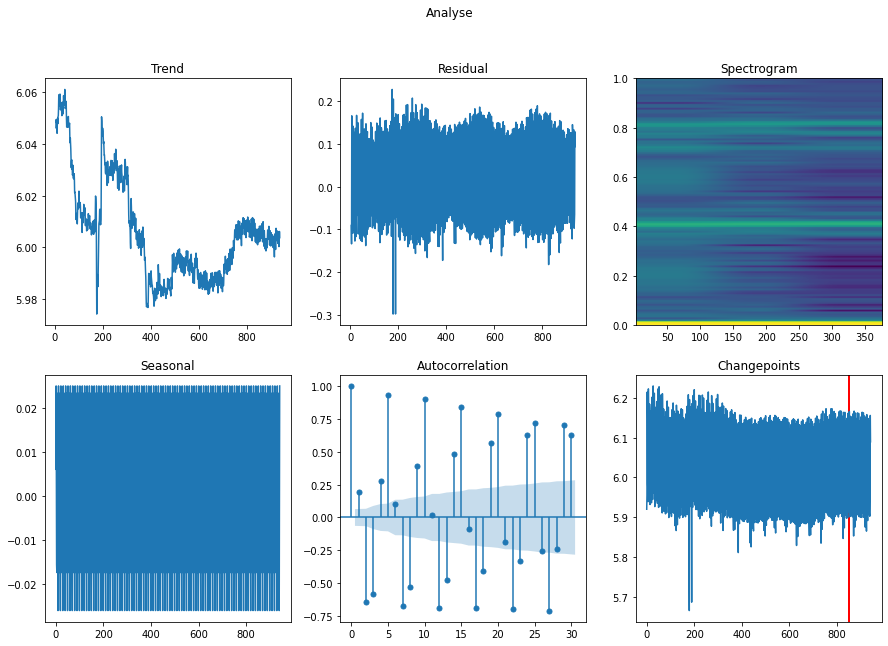

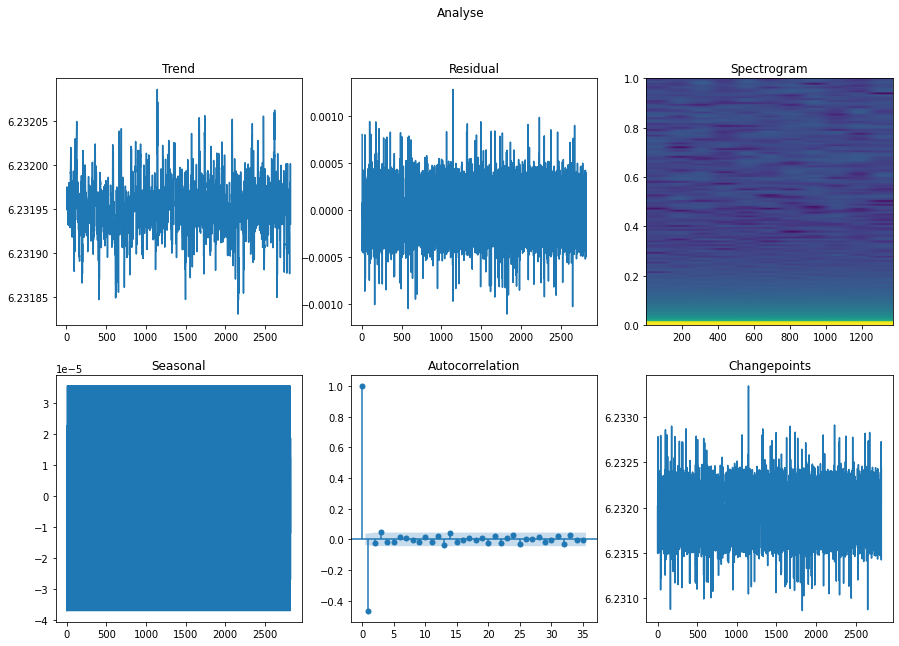

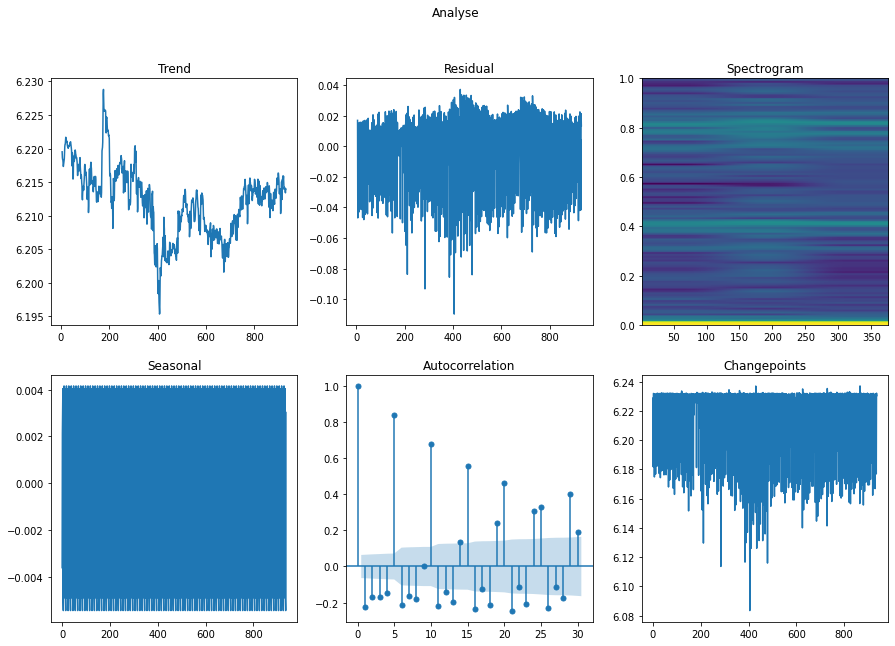

...

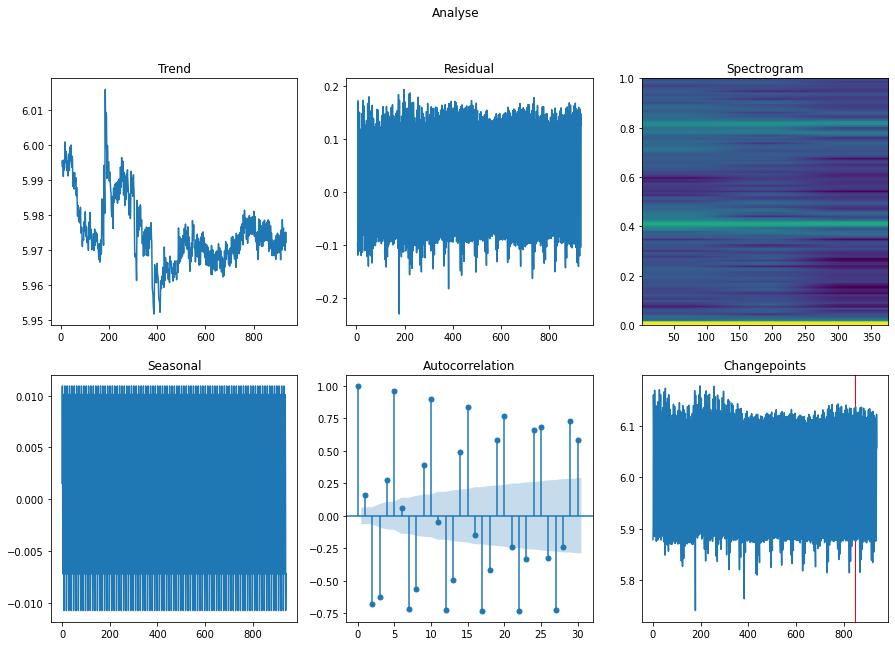

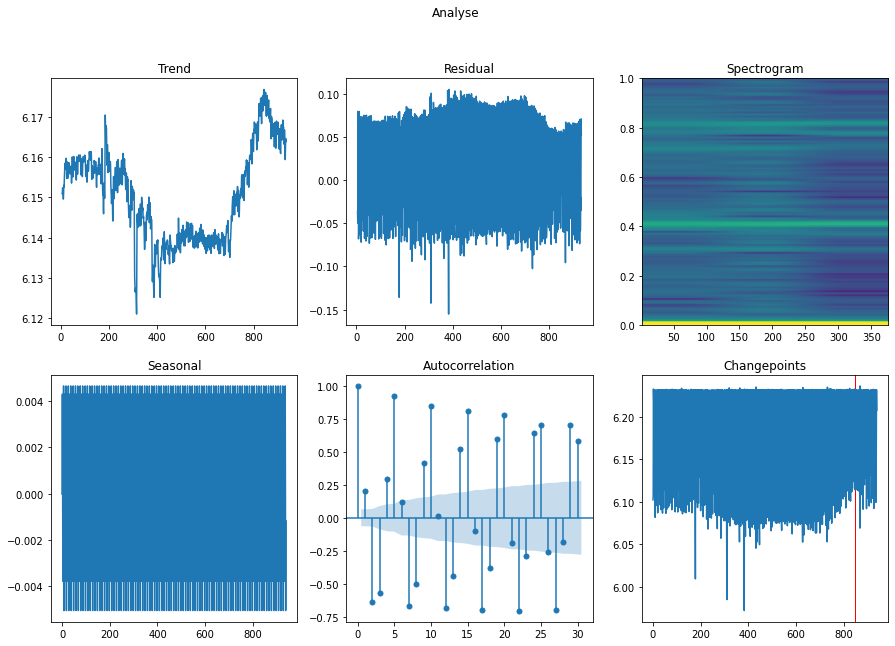

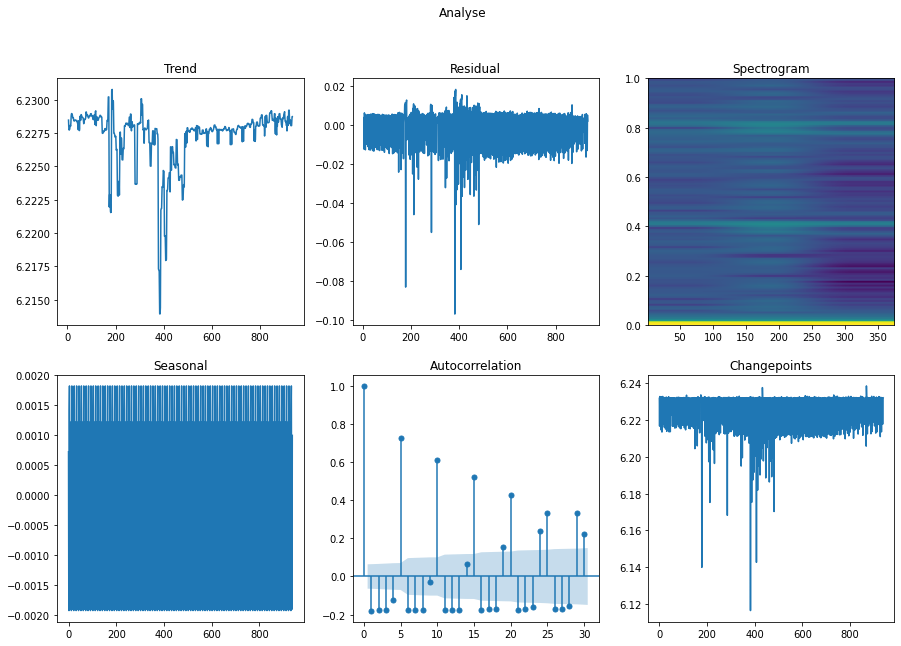

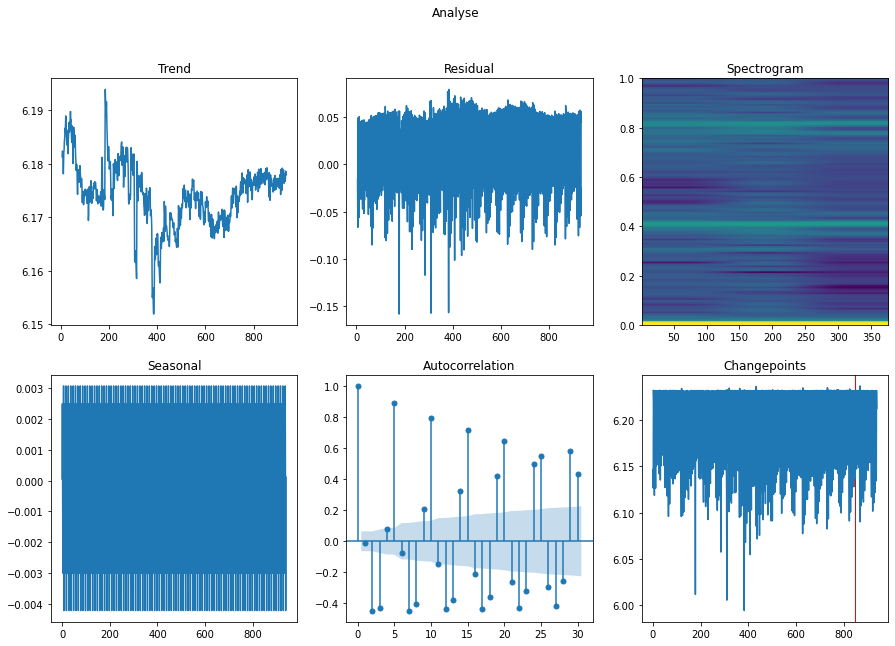

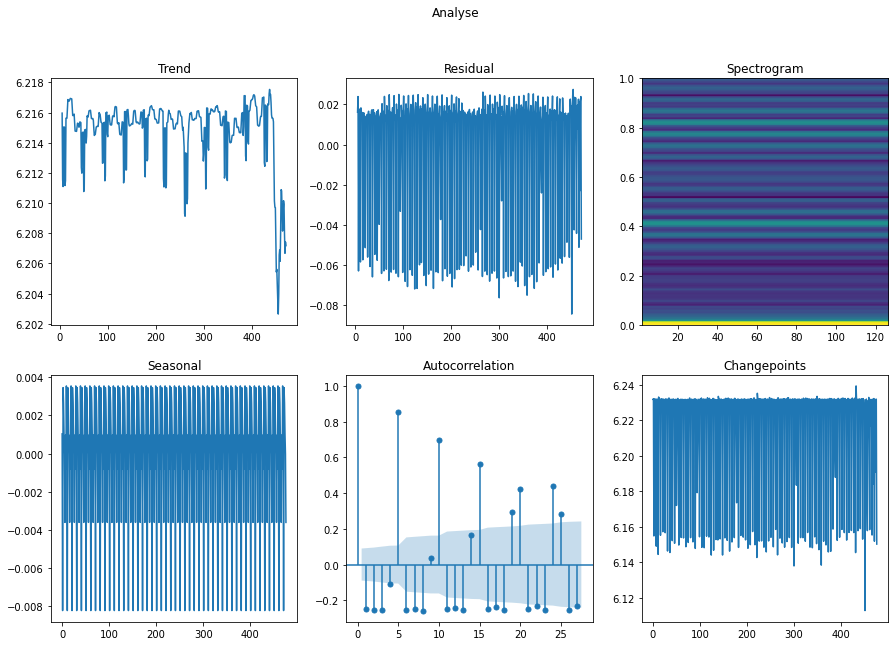

In [27]:
for element in Mat[7]:
    fig,axs = plt.subplots(2,3,figsize=(15,10))
    decomp = sm.tsa.seasonal_decompose(np.array(element),period=10)
    dic = changepoint_detection(np.array(element),plot=False)            
    axs[0,0].plot(decomp.trend)
    axs[0,0].title.set_text("Trend")
    axs[0,1].plot(decomp.resid)
    axs[0,1].title.set_text("Residual")
    axs[0,2].specgram(element, noverlap=len(ts)/10)
    axs[0,2].title.set_text("Spectrogram")
    axs[1,0].plot(decomp.seasonal)
    axs[1,0].title.set_text("Seasonal")
    axs[1,2].plot(np.array(element))
    if len(dic["best"]) > 1 :
        for i in range(1,len(dic["best"])):
            if dic["best"][i]< 0.92*len(element) :
                axs[1,2].axvspan(xmin=dic["best"][i],xmax=dic["best"][i]+1,ymin=0,ymax=np.max(np.array(element)),color="red")
    axs[1,2].title.set_text("Changepoints")
    sm.graphics.tsa.plot_acf(np.array(element),ax=axs[1,1])
    fig.suptitle("Analyse")
    plt.savefig("class_7.png")
    plt.show()

In [6]:
from kshape.core import kshape, zscore

time_series = []
for key,signal in Mat.items(): 
    length_max = 0
    for sig in signal :
        if length_max < sig.size :
            length_max = sig.size
        arr = np.ones((2897))+np.mean(np.array(sig))
        arr[: len(sig)]=np.array(sig)
        time_series.append(arr)
time_series = [np.array(ele)[: length_max] for ele in time_series ]
cluster_num = 18
clusters = kshape(zscore(time_series, axis=1), cluster_num)


In [7]:
print(clusters)

[(array([ 1.37957525,  1.33012805,  1.50415383,  1.34325058,  1.47296474,
        1.40190104,  1.50568842,  1.2438176 ,  0.99313578,  0.98373999,
        0.87737787,  0.99548466,  0.85890843,  0.95768679,  0.93839861,
        0.74010028,  0.60940731,  0.52093945,  0.48426255,  0.40837179,
       -0.0095403 , -0.78442098, -0.97766057, -1.47983342, -1.60810907,
       -1.73413628, -1.26404482, -1.55031674, -0.01796549, -0.17270774,
        0.55716393,  0.46399958,  0.03664078, -0.07232993, -0.68221936,
       -0.91216717, -0.99347553, -0.92174503, -0.84121661, -0.92680305,
       -0.82819006, -0.92225971, -0.89603766, -0.9908906 , -0.82338333,
       -0.97040518, -0.90156637, -1.06696874, -1.22551244, -0.76757079,
       -0.77587701,  0.26981605,  0.83227501,  0.84125324,  0.9026409 ,
        0.87441043,  0.82457763,  0.81587131,  0.90245141,  0.87090859,
        0.91515567,  1.01685199,  0.86700583,  0.41293256, -0.41712252,
       -1.03438932, -1.27971043, -1.39354189, -1.38828663, -1.

In [8]:
elements = os.listdir("../classes")
Mat = {}
for element in elements :
    if element[0] != "m" :
        new_mat = []
        dirs = os.listdir("../classes/"+element)
        for dir in dirs:
            if dir[-3 :] == "png" and dir[0]!="m":
                new_mat.append(int(dir.replace(".png","")))
        Mat[int(element.replace("class_",""))] = new_mat

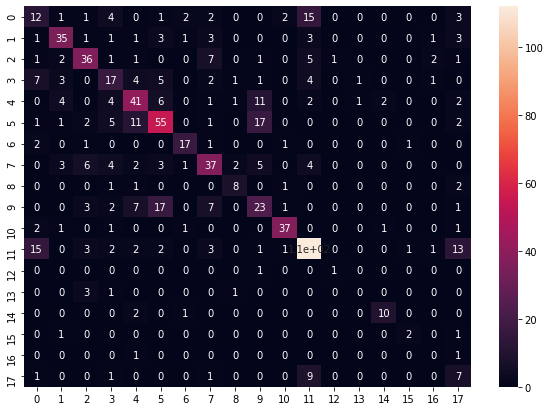

In [21]:
list_R = np.zeros((1,798))
for i in range(796):
    for key, value in Mat.items():
        for element in value :
            list_R[0,element]=key

elements = os.listdir("../classes")
Mat = {}
for element in elements :
    if element[0] != "m" :
        new_mat = []
        dirs = os.listdir("../classes/"+element)
        for dir in dirs:
            if dir[-3 :] == "png" and dir[0]!="m":
                new_mat.append(int(dir.replace(".png","")))
        Mat[int(element.replace("class_",""))] = new_mat

matrix= np.zeros((18,18))
for key, value in Mat.items():
    for num in value :
        #print(num)
        #print(key,num,int(list_R[0,num-1]-1))
        matrix[key-1,int(list_R[0,num-1]-1)] = matrix[key-1,int(list_R[0,num-1]-1)] + 1

import itertools
import sys

import munkres
import numpy as np
import seaborn as sn 

def permute_cols(a, inds):
    p = np.zeros_like(a)
    for i in inds:
        p[i] = 1
    return np.dot(a, p)

def maximize_trace(a):
    assert a.shape[0] == a.shape[1]
    d = np.zeros_like(a)
    n = a.shape[0]
    b = np.eye(n, dtype=int)
    for i, j in itertools.product(range(n), range(n)):
        d[j, i] = sum((b[j, :]-a[i, :])**2)
    m = munkres.Munkres()
    inds = m.compute(d)
    return permute_cols(a, inds)

new_m = maximize_trace(matrix)

plt.figure(figsize = (10,7))
sn.heatmap(new_m, annot=True)
plt.show()

In [22]:
accu = np.sum([new_m[i,i] for i in range(new_m.shape[0])])/798
print(accu)

0.5639097744360902


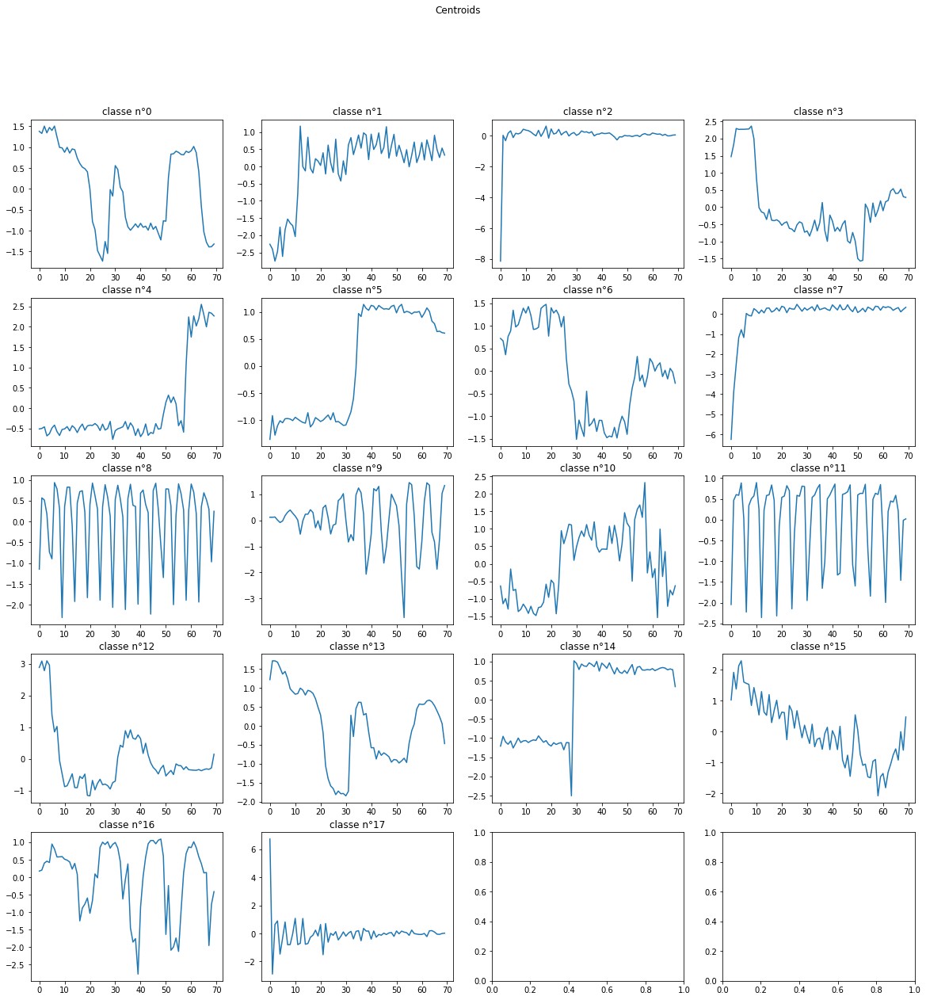

In [11]:
fig , axs = plt.subplots(5,4,figsize=(20,20))
j=0
for i in range(18):
    ts = clusters[i][0]
    axs[j//4,j%4].plot(ts)
    axs[j//4,j%4].title.set_text("classe n°"+str(i))
    j+=1
fig.suptitle("Centroids")
plt.show()


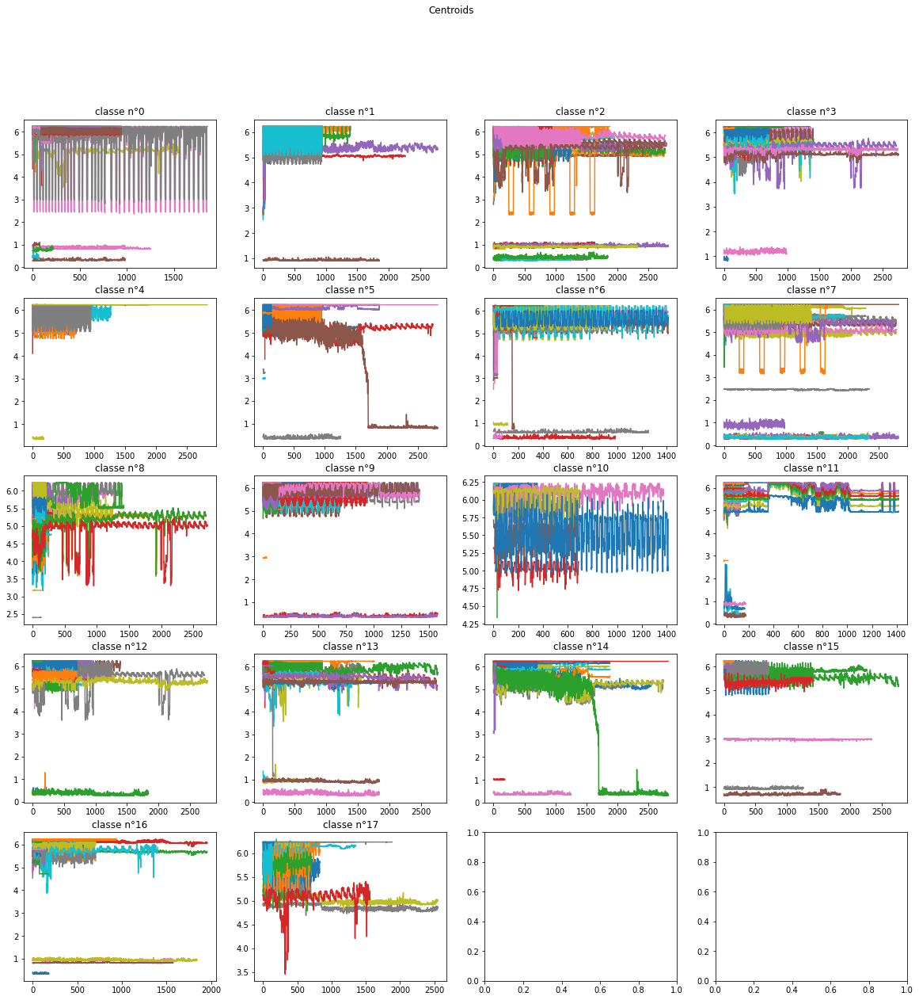

In [15]:
fig , axs = plt.subplots(5,4,figsize=(20,20))
for i in range(len(clusters)):
    for j in clusters[i][1] :
        j = int(j+1)
        ts = pd.read_csv("{}.csv".format(j))["x"]
        axs[i//4,i%4].plot(ts)
        axs[i//4,i%4].title.set_text("classe n°"+str(i))
fig.suptitle("Centroids")
plt.show()

ADF Statistic: -6.620581
p-value: 0.000000
Critical Values:
	1%: -3.454
	5%: -2.872
	10%: -2.572


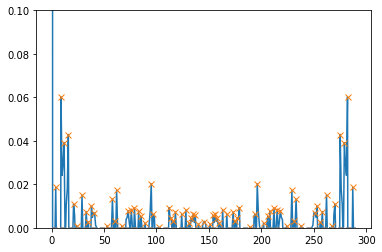

In [25]:

signal = np.array(pd.read_csv("11.csv")["x"])
result = adfuller(signal)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))
from scipy.signal import find_peaks
signal = np.fft.fft(signal)/len(signal)
peaks, _ = find_peaks(signal, height=0)

plt.plot(signal)
plt.ylim(0,0.1)

plt.plot(peaks, signal[peaks], "x")

plt.plot(np.zeros_like(signal), "--", color="gray")

plt.show()

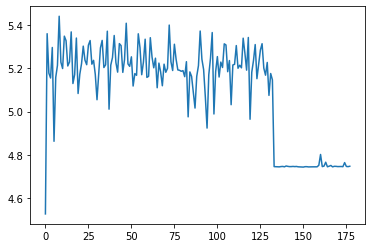

In [26]:
plt.plot(pd.read_csv("105.csv")["x"])

In [27]:
from statsmodels.tsa.stattools import acf
class Preprocessor():
    def __init__(self,signal):
        self.signal = np.array(signal)
    def is_stationnary(self):
        result = adfuller(self.signal)
        return int(result[1]<0.05)
    def mean(self):
        return np.mean(self.signal)
    def max_sig(self):
        return np.max(self.signal)
    def en(self):
        return np.sum(np.square(self.signal))/len(self.signal)
    def std(self):
        return np.std(np.array(sig))
    def acf_val(self,length=15):
        return acf(self.signal)[:length]
    def is_changepoint(self):
        dic = changepoint_detection(self.signal,plot=False)
        return len(dic["best"])-2
    

In [28]:
signal = np.array(pd.read_csv("105.csv")["x"])
preproc = Preprocessor(signal)
print(preproc.is_stationnary())
print(preproc.mean())
print(preproc.max_sig())
print(preproc.en())
print(preproc.std())
print(preproc.acf_val())
print(preproc.is_changepoint())

0
5.092785212451907
5.44004427909091
25.986134872401635
0.031145469975873617
[1.         0.79410078 0.77200356 0.7712879  0.74273042 0.7468669
 0.7093127  0.71277122 0.65160622 0.63298691 0.62812491 0.62156162
 0.56174446 0.55129647 0.58704013]
1


In [29]:
df = pd.DataFrame(columns = ['STAT', 'MEAN', 'MAX',"EN","STD","ACF1","ACF2","ACF3","ACF4""ACF5""ACF6""ACF7","ACF8","ACF9","ACF10","ACF11","ACF12","ACF13","ACF14","ACF15","CHANG"])
for i in range(1,797):
    signal = np.array(pd.read_csv(str(i)+".csv")["x"])
    preproc = Preprocessor(signal)
    df.loc[i,"STAT"]=preproc.is_stationnary()
    df.loc[i,"MEAN"]=preproc.mean()
    df.loc[i,"MAX"]=preproc.max_sig()
    df.loc[i,"EN"]=preproc.en()
    df.loc[i,"STD"]=preproc.std()
    acf_values = preproc.acf_val()
    for j in range(1,14):
        name = "ACF"+str(j)
        df.loc[i,name]=acf_values[j-1]
    df.loc[i,"CHANG"]=preproc.is_changepoint()

In [30]:
print(df.dropna(axis=1))

    STAT     MEAN      MAX       EN        STD ACF1       ACF2       ACF3  \
1      1  5.37925  5.98849   29.054  0.0311455    1   0.779276   0.628167   
2      1  5.95074  6.25287  35.4622  0.0311455    1   0.802428   0.618279   
3      1  5.67188  6.10732  32.1888  0.0311455    1   0.400291   0.398493   
4      1  5.89882  6.20474  34.8206  0.0311455    1   0.634621   0.603715   
5      1  5.92747   6.1686  35.1529  0.0311455    1   0.462516   0.438231   
..   ...      ...      ...      ...        ...  ...        ...        ...   
792    1  5.62598  5.87228  31.6535  0.0311455    1    0.96621   0.920468   
793    1  6.11259  6.23238  37.3651  0.0311455    1   0.987962   0.970686   
794    1  6.23189  6.23262  38.8365  0.0311455    1  -0.333756   -0.01239   
795    1  6.23188  6.23262  38.8363  0.0311455    1  -0.311952 -0.0472582   
796    1  6.23196  6.23816  38.8374  0.0311455    1 -0.0233511 -0.0311126   

          ACF8        ACF9        ACF10      ACF11       ACF12      ACF13  

In [31]:
elements = os.listdir("../classes")
Mat = {}
for element in elements :
    if element[0] != "m" :
        new_mat = []
        dirs = os.listdir("../classes/"+element)
        for dir in dirs:
            if dir[-3 :] == "png" and dir[0]!="m":
                new_mat.append(int(dir.replace(".png","")))
        Mat[int(element.replace("class_",""))] = new_mat
y = np.zeros((798))
for key,signal in Mat.items(): 
    length_max = 0
    for sig in signal :
        y[int(sig)]=key

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.dropna(axis=1), y[:796], test_size=0.33, random_state=42)
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

[Text(141.80716791775458, 211.7178947368421, 'X[12] <= -0.06\ngini = 0.903\nsamples = 533\nvalue = [14, 34, 38, 40, 25, 54, 54, 11, 45, 9, 45, 23\n108, 2, 3, 10, 3, 2, 13]'),
 Text(57.70765339425588, 200.2736842105263, 'X[13] <= 0.593\ngini = 0.775\nsamples = 179\nvalue = [9, 21, 0, 2, 6, 10, 5, 9, 2, 2, 2, 21, 77, 0\n1, 8, 0, 1, 3]'),
 Text(45.483191906005224, 188.82947368421054, 'X[7] <= 0.273\ngini = 0.726\nsamples = 157\nvalue = [9, 21, 0, 2, 5, 10, 5, 9, 2, 2, 2, 1, 77, 0\n1, 7, 0, 1, 3]'),
 Text(32.398237597911226, 177.38526315789474, 'X[2] <= 6.238\ngini = 0.856\nsamples = 59\nvalue = [3, 15, 0, 0, 5, 7, 5, 9, 1, 1, 1, 0, 9, 0\n1, 0, 0, 1, 1]'),
 Text(22.18159268929504, 165.94105263157894, 'X[8] <= -0.182\ngini = 0.843\nsamples = 50\nvalue = [3, 14, 0, 0, 5, 7, 5, 1, 1, 1, 1, 0, 9, 0\n1, 0, 0, 1, 1]'),
 Text(6.993211488250653, 154.49684210526317, 'X[9] <= -0.231\ngini = 0.485\nsamples = 13\nvalue = [1, 9, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0]'),
 Text(3.496605744125

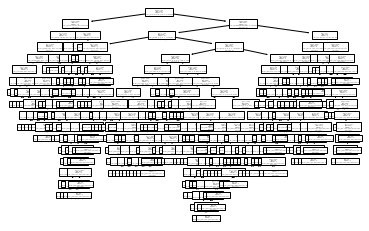

In [33]:
tree.plot_tree(clf) 

    STAT     MEAN      MAX       EN        STD ACF1       ACF2       ACF3  \
1      1  5.37925  5.98849   29.054  0.0311455    1   0.779276   0.628167   
2      1  5.95074  6.25287  35.4622  0.0311455    1   0.802428   0.618279   
3      1  5.67188  6.10732  32.1888  0.0311455    1   0.400291   0.398493   
4      1  5.89882  6.20474  34.8206  0.0311455    1   0.634621   0.603715   
5      1  5.92747   6.1686  35.1529  0.0311455    1   0.462516   0.438231   
..   ...      ...      ...      ...        ...  ...        ...        ...   
792    1  5.62598  5.87228  31.6535  0.0311455    1    0.96621   0.920468   
793    1  6.11259  6.23238  37.3651  0.0311455    1   0.987962   0.970686   
794    1  6.23189  6.23262  38.8365  0.0311455    1  -0.333756   -0.01239   
795    1  6.23188  6.23262  38.8363  0.0311455    1  -0.311952 -0.0472582   
796    1  6.23196  6.23816  38.8374  0.0311455    1 -0.0233511 -0.0311126   

    ACF4ACF5ACF6ACF7       ACF8  ...       ACF12      ACF13 ACF14 ACF15 CHA

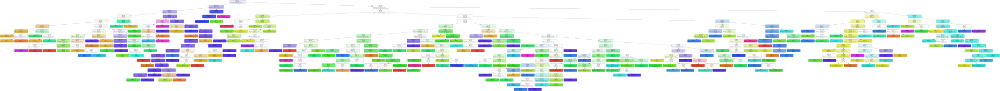

In [34]:
import graphviz 
df["class"]=[str(int(y[i])) for i in range(796)]
print(df)
%matplotlib qt
dot_data = tree.export_graphviz(clf, out_file=None, 
                     feature_names=df.dropna(axis=1).drop(columns=["class"]).columns, 
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data)  
graph


In [35]:
from sklearn.tree import export_text
print(list(df.dropna(axis=1).drop(columns=["class"]).columns))
r = export_text(clf, feature_names=list(df.dropna(axis=1).drop(columns=["class"]).columns))
print(r)

['STAT', 'MEAN', 'MAX', 'EN', 'STD', 'ACF1', 'ACF2', 'ACF3', 'ACF8', 'ACF9', 'ACF10', 'ACF11', 'ACF12', 'ACF13', 'CHANG', 'ACF4', 'ACF5', 'ACF6', 'ACF7']
|--- ACF12 <= -0.06
|   |--- ACF13 <= 0.59
|   |   |--- ACF3 <= 0.27
|   |   |   |--- MAX <= 6.24
|   |   |   |   |--- ACF8 <= -0.18
|   |   |   |   |   |--- ACF9 <= -0.23
|   |   |   |   |   |   |--- ACF12 <= -0.17
|   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |--- ACF12 >  -0.17
|   |   |   |   |   |   |   |--- ACF3 <= -0.20
|   |   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |   |--- ACF3 >  -0.20
|   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |   |   |   |--- ACF9 >  -0.23
|   |   |   |   |   |   |--- ACF8 <= -0.23
|   |   |   |   |   |   |   |--- class: 6.0
|   |   |   |   |   |   |--- ACF8 >  -0.23
|   |   |   |   |   |   |   |--- MAX <= 5.98
|   |   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |   |--- MAX >  5.98
|   |   |   |   |   |   |   |   |--- class: 7

In [36]:
ypred = clf.predict(X_test)

In [37]:
print(np.sum([int(ypred[i]==y_test[i]) for i in range(len(ypred))])/len(ypred))

0.41064638783269963
